The PP4AV dataset was used in this experiment, with ResNet-50 as the backbone for both the teacher and student models.
FCOS was used as the teacher model; CrossKD and LD were both distilled from the same teacher.
All models were trained using a 2x schedule (24 epochs), and most training parameters were kept the same. The optimizer used was SGD, IoU=0.5.

### model test  
#### Detection Results Comparison

| Model   | bbox_mAP | bbox_mAP_50 | bbox_mAP_75 | AR        | License Plate   | Face      | Iter Time |
|---------|----------|-------------|-------------|-----------|-----------------|-----------|-----------|
| FCOS    | 0.411    | 0.759       | 0.378       | 0.495     | 0.607           | 0.215     | 0.4153    |
| CrossKD | 0.421    | 0.771       | 0.396       | 0.504     | 0.612           | 0.229     | 0.3892    |
| LD      | 0.429    | 0.772       | 0.395       | 0.494     | 0.617           | 0.240     | 0.3092    | 
|CrossKD_PKD |0.419  | 0.770       | 0.394       | 0.499     | 0.611           | 0.228     | 0.2363    |
|CrossKD_R18|0.405   |0.748        | 0.379       | 0.486     | 0.597           |0.212      | 0.2098    |



FCOS:  as baseline and teacher model, it has a good bbox_mAP(0.402) and bbox_mAP_50(0.742), but not good at small object(face). Moderate iteration time.   
  
CrossKD: Best overall, faster iteration time. Suggests CrossKD is both more accurate and more efficient than FCOS.  
  
LD:  Slightly worse bbox_mAP (0.397), bbox_mAP_50 (0.727), slowest iteration time(0.845), this model is less efficient and less accurate than the others.

In [10]:
# teacher model - fcos
! python tools/test.py configs/fcos/fcos_r50-caffe_fpn_gn-head_2x_coco.py work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth

07/11 13:40:46 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.20 (default, Oct  3 2024, 15:24:27) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 1384606639
    GPU 0,1: NVIDIA GeForce RTX 3090
    CUDA_HOME: None
    GCC: gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0
    PyTorch: 1.12.1
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-w7xlc2e5 because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
07/11 13:41:32 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
07/11 13:41:32 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHoo

In [11]:
# crosskd 
! python tools/test.py configs/crosskd/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py work_dirs/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth

07/11 13:43:34 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.20 (default, Oct  3 2024, 15:24:27) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 1667700373
    GPU 0,1: NVIDIA GeForce RTX 3090
    CUDA_HOME: None
    GCC: gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0
    PyTorch: 1.12.1
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-_ytbz2kp because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
07/11 13:44:12 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
07/11 13:44:12 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) Check

In [12]:
# ld - localization distillation
! python tools/test.py configs/ld/ld_r50-gflv1-r101_fpn_1x_coco.py work_dirs/ld_r50-gflv1-r101_fpn_1x_coco/epoch_24.pth

07/11 13:46:09 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.20 (default, Oct  3 2024, 15:24:27) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 352991509
    GPU 0,1: NVIDIA GeForce RTX 3090
    CUDA_HOME: None
    GCC: gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0
    PyTorch: 1.12.1
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_6

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-9pkdtl77 because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
/Ziob/343312/AVD-Anonymizer/CrossKD/mmdet/models/dense_heads/anchor_head.py:108: UserWarning: DeprecationWarning: `num_anchors` is deprecated, for consistency or also use `num_base_priors` instead
  warnings.warn('DeprecationWarning: `num_anchors` is deprecated, '
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: bbox_head.conv_cls.weight, bbox_head.conv_cls.bias, bbox_head.conv_reg.weight, bbox_head.conv_reg.bias, bbox_head.conv_centerness.weight, bbox_head.conv_centerness.bias

missing keys in 

In [1]:
# crosskd + pkd
! python tools/test.py configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth

07/12 22:08:31 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.20 (default, Oct  3 2024, 15:24:27) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 236938043
    GPU 0,1: NVIDIA GeForce RTX 3090
    CUDA_HOME: None
    GCC: gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0
    PyTorch: 1.12.1
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_6

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-di2sq_xm because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
07/12 22:09:15 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
07/12 22:09:15 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) Check

In [2]:
! python tools/test.py configs/crosskd/crosskd_r18_fcos.py work_dirs/crosskd_r18_fcos/epoch_24.pth

07/12 22:11:19 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.20 (default, Oct  3 2024, 15:24:27) [GCC 11.2.0]
    CUDA available: True
    numpy_random_seed: 106995117
    GPU 0,1: NVIDIA GeForce RTX 3090
    CUDA_HOME: None
    GCC: gcc (Ubuntu 13.3.0-6ubuntu2~24.04) 13.3.0
    PyTorch: 1.12.1
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2023.1-Product Build 20230303 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_6

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-8gmiya8x because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
07/12 22:11:56 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
07/12 22:11:56 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
before_train:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) Check

In [5]:
import sys
from types import SimpleNamespace
import matplotlib.pyplot as plt
from mmdet.apis import init_detector, inference_detector
from mmdet.utils import register_all_modules
from mmdet.registry import VISUALIZERS
import mmcv
from tools.analysis_tools.analyze_logs import *
# %matplotlib notebook
sys.path.append('/Ziob/343312/AVD-Anonymizer/CrossKD/tools/analysis_tools')

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-yqj1fm44 because the default path (/home/i343312/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [6]:
fcos = "work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/best/vis_data/20250524_100950.json"
# fcos_t = "work_dirs/fcos_r50-caffe_fpn_s_2x_pp4av_0107/20250701_202458/vis_data/20250701_202458.json"
crosskd = "work_dirs/crosskd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250526_091450.json"
ld = "work_dirs/ld_r50-gflv1-r101_fpn_1x_coco/best/vis_data/20250601_002104.json"
crosskd_pkd = "work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250530_154734.json"
crosskd_r18 = 'work_dirs/crosskd_r18_fcos/best/vis_data/20250531_003026.json'


In [9]:
fcos_cfg = 'configs/fcos/fcos_r50-caffe_fpn_gn-head_2x_coco.py'
fcos_pth = 'work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth'

# fcos_t_cfg = 'configs/fcos/fcos_r50-caffe_fpn_s_2x_pp4av.py'
# fcos_t_pth = 'work_dirs/fcos_r50-caffe_fpn_s_2x_pp4av_0107/epoch_24.pth'

crosskd_cfg = 'configs/crosskd/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py'
crosskd_pth = 'work_dirs/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth'

ld_cfg = 'configs/ld/ld_r50-gflv1-r101_fpn_1x_coco.py'
ld_pth = 'work_dirs/ld_r50-gflv1-r101_fpn_1x_coco/epoch_24.pth'

crosskd_pkd_cfg = 'configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py'
crosskd_pkd_pth = 'work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth'

crosskd_r18_cfg = 'configs/crosskd/crosskd_r18_fcos.py'
crosskd_r18_pth = 'work_dirs/crosskd_r18_fcos/epoch_24.pth'


In [10]:
register_all_modules()
fcos_model = init_detector(fcos_cfg, fcos_pth, device='cuda:0')
# fcos_t_model = init_detector(fcos_t_cfg, fcos_t_pth, device='cuda:0')
crosskd_model = init_detector(crosskd_cfg, crosskd_pth, device='cuda:0')
ld_model = init_detector(ld_cfg, ld_pth, device='cuda:0')
crosskd_pkd_model = init_detector(crosskd_pkd_cfg, crosskd_pkd_pth, device='cuda:0')
crosskd_r18_model = init_detector(crosskd_r18_cfg, crosskd_r18_pth, device='cuda:0')

Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth


/Ziob/343312/AVD-Anonymizer/CrossKD/mmdet/models/dense_heads/anchor_head.py:108: UserWarning: DeprecationWarning: `num_anchors` is deprecated, for consistency or also use `num_base_priors` instead
  warnings.warn('DeprecationWarning: `num_anchors` is deprecated, '


Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: bbox_head.conv_cls.weight, bbox_head.conv_cls.bias, bbox_head.conv_reg.weight, bbox_head.conv_reg.bias, bbox_head.conv_centerness.weight, bbox_head.conv_centerness.bias

missing keys in source state_dict: bbox_head.gfl_cls.weight, bbox_head.gfl_cls.bias, bbox_head.gfl_reg.weight, bbox_head.gfl_reg.bias, bbox_head.integral.project

Loads checkpoint by local backend from path: work_dirs/ld_r50-gflv1-r101_fpn_1x_coco/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth
Loads checkpoint by local backend from path: work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth
Loads checkpoint by local backend from p

In [11]:
import cv2
import matplotlib.pyplot as plt

def plot_yolo_boxes(image_path, label_path, class_names=None):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape
    with open(label_path, 'r') as f:
        lines = f.readlines()
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])
        x1 = int((x_center - width / 2) * w)
        y1 = int((y_center - height / 2) * h)
        x2 = int((x_center + width / 2) * w)
        y2 = int((y_center + height / 2) * h)
        color = (0, 255, 0)
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        if class_names:
            cv2.putText(image, class_names[class_id], (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 1)

#     plt.figure(figsize=(8, 6))
#     plt.imshow(image)
    return image


ground_ture = plot_yolo_boxes("data/pp4av_dataset/val/frame_003430.png", "data/pp4av_dataset/labels/val/frame_003430.txt", class_names=["face", "license_plate"])


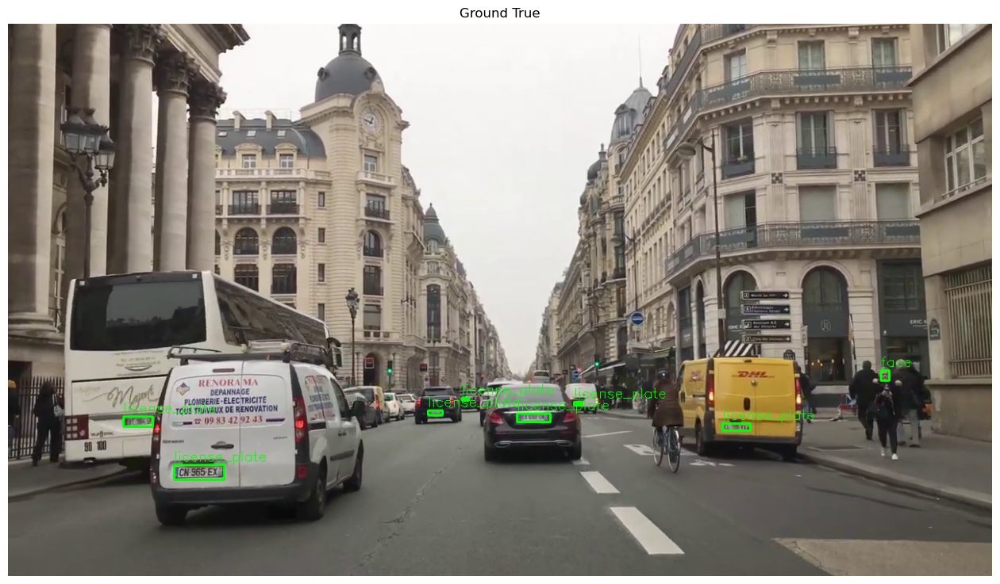

/Ziob/343312/miniconda/envs/crosskd/lib/python3.8/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1659484810403/work/aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


07/12 22:17:17 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/Ziob/343312/miniconda/envs/crosskd/lib/python3.8/site-packages/mmengine/utils/manager.py:113: UserWarning: <class 'mmdet.visualization.local_visualizer.DetLocalVisualizer'> instance named of visualizer has been created, the method `get_instance` should not accept any other arguments
  warnings.warn(


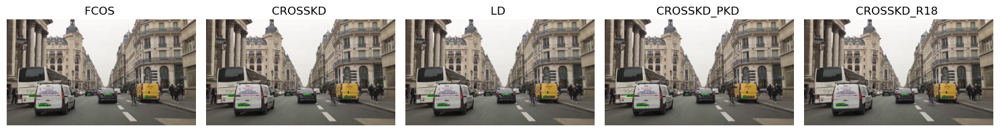

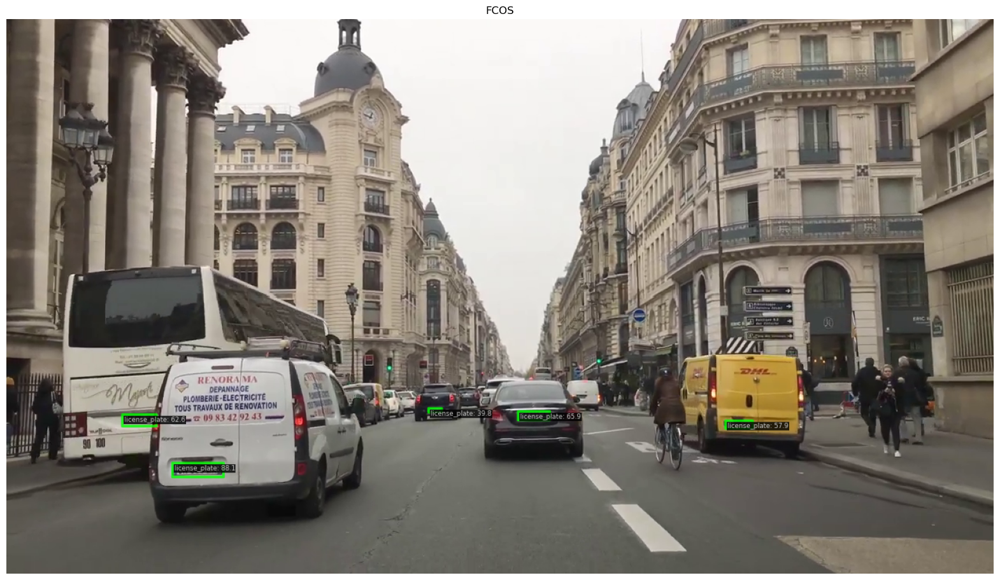

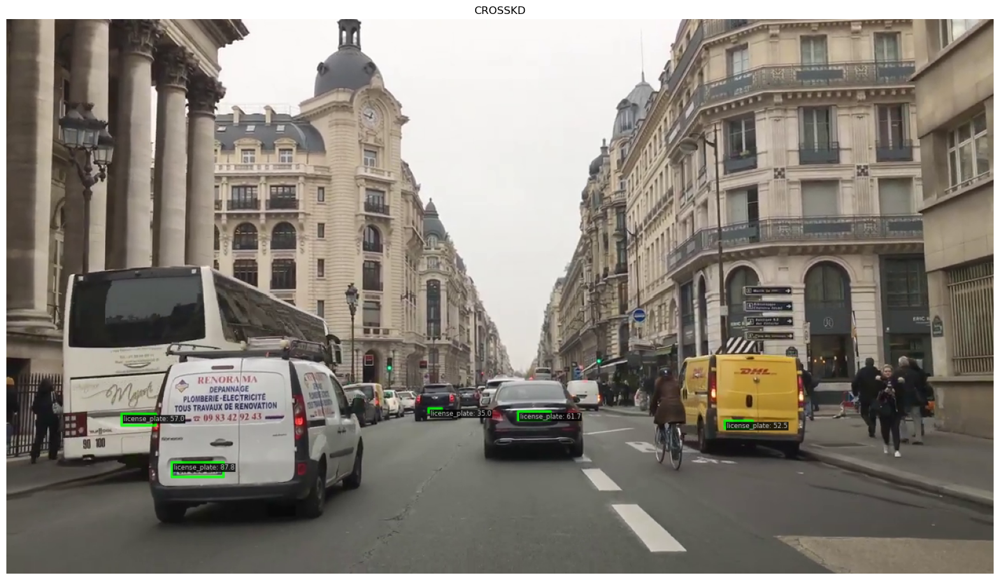

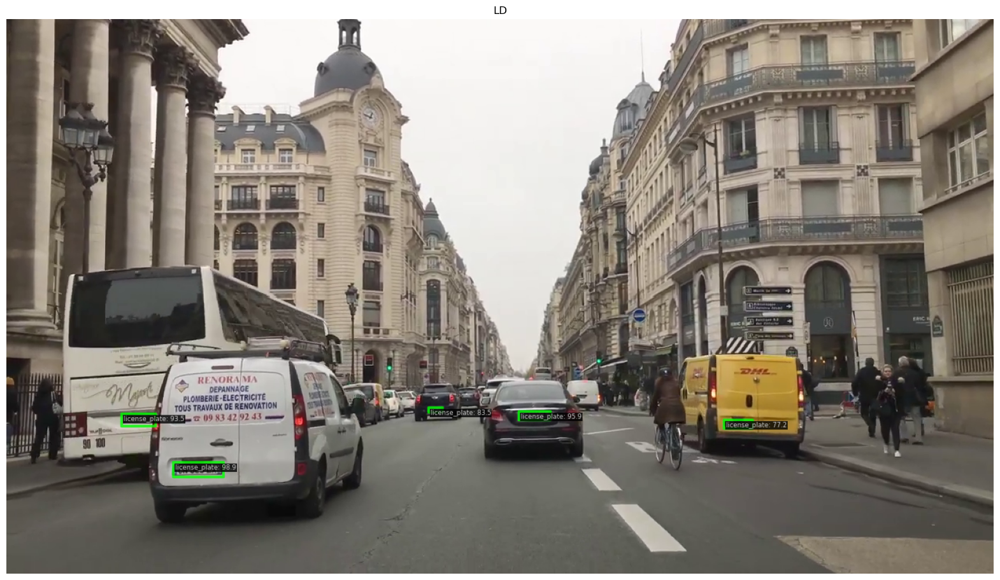

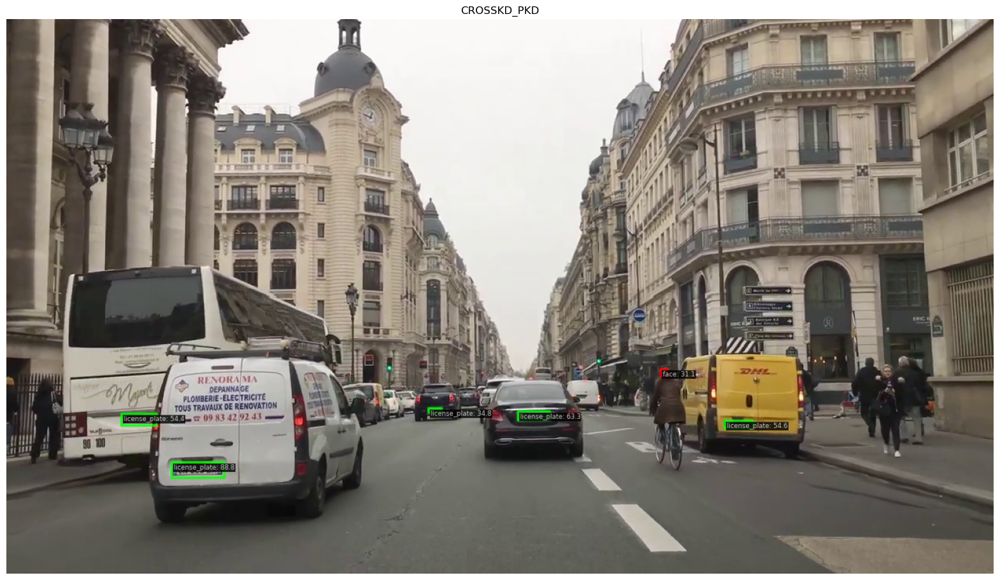

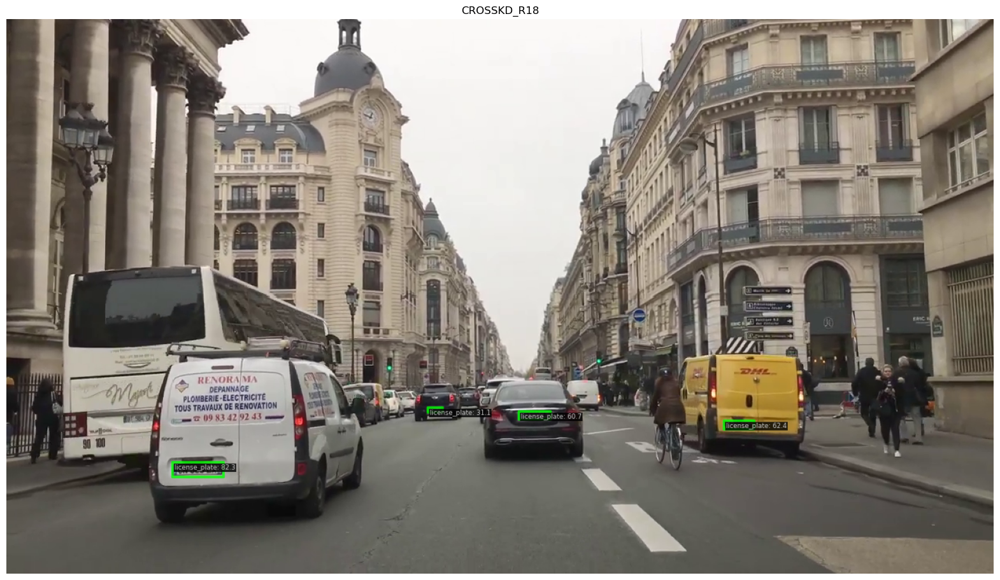

In [12]:
img = mmcv.imread('data/pp4av_dataset/val/frame_003430.png', channel_order='rgb')


plt.figure(figsize=(16, 10))
plt.imshow(ground_ture)
plt.title('Ground True')
plt.axis('off')
plt.show()

models = [
    (fcos_model, "fcos"),
    (crosskd_model, "crosskd"),
    (ld_model, "ld"),
    (crosskd_pkd_model, "crosskd_pkd"),
    (crosskd_r18_model, "crosskd_r18"),
]

fig, axes = plt.subplots(1, len(models), figsize=(15, 5))
if len(models) == 1:
    axes = [axes]

for idx, (model, name) in enumerate(models):
    result = inference_detector(model, img)
    visualizer = VISUALIZERS.build(model.cfg.visualizer)
    visualizer.dataset_meta = model.dataset_meta
    vis_img = visualizer.add_datasample(
        name,
        img,
        data_sample=result,
        draw_gt=False,
        wait_time=0
    )
    
    if vis_img is not None:
        display_img = vis_img
    else:
        img_copy = img.copy()
        visualizer.add_datasample(
            name,
            img_copy,
            data_sample=result,
            draw_gt=False,
            wait_time=0
        )
        display_img = visualizer.get_image()
    
    axes[idx].imshow(display_img)
    axes[idx].set_title(f'{name.upper()} ')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

for model, name in models:
    plt.figure(figsize=(20, 16))
    result = inference_detector(model, img)
    
    visualizer = VISUALIZERS.build(model.cfg.visualizer)
    visualizer.dataset_meta = model.dataset_meta
    
    img_copy = img.copy()
    visualizer.add_datasample(
        name,
        img_copy,
        data_sample=result,
        draw_gt=False,
        wait_time=0
    )
    

    vis_img = visualizer.get_image()
    plt.imshow(vis_img)
    plt.title(f'{name.upper()}')
    plt.axis('off')
    plt.show()
    


### parameter size

In [15]:
def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable

In [16]:
for model, name in models:
    total_params, trainable_params = count_parameters(model)
    print(f'{name.upper()} Total parameters: {total_params:,}')
    print(f'Trainable parameters: {trainable_params:,}')
    print('')

FCOS Total parameters: 32,181,324
Trainable parameters: 31,905,804

CROSSKD Total parameters: 32,181,324
Trainable parameters: 31,905,804

LD Total parameters: 32,326,539
Trainable parameters: 32,101,195

CROSSKD_PKD Total parameters: 32,181,324
Trainable parameters: 31,905,804

CROSSKD_R18 Total parameters: 19,112,524
Trainable parameters: 18,946,060



### log analysis

All three models perform similarly in the end, but crosskd shows faster and more stable improvement.

for classification loss, crosskd is best at learning class labels, LD the weakest, but fcos is best at predicting precise bounding boxes.

<IPython.core.display.Javascript object>


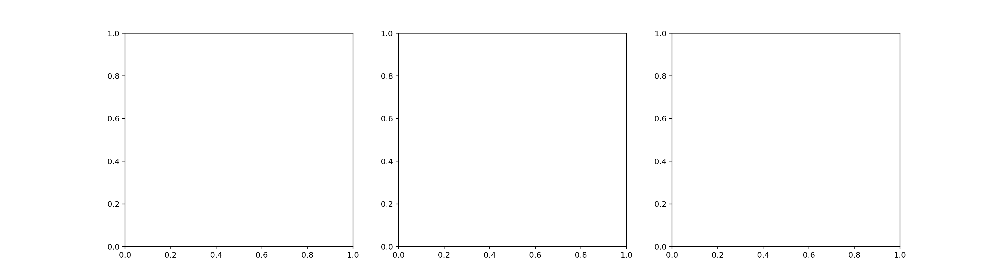

FileNotFoundError: [Errno 2] No such file or directory: 'work_dirs/crosskd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250526_091450.json'

In [17]:
%matplotlib notebook 
def plot_keys(json_logs, legends):    
    keys = ['bbox_mAP', 'loss_cls', 'loss_bbox']
    titles = ['bbox_mAP', 'Classification Loss', 'Bounding Box Loss']
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    plt.style.use('bmh')
    
    for i, (key, title) in enumerate(zip(keys, titles)):
        args = SimpleNamespace(
            json_logs=json_logs,
            keys=[key],
            start_epoch='0',
            eval_interval='1',
            title=title,
            legend=legends,
            backend=None,
            style='white',
            out=None
        )
        
        log_dicts = load_json_logs(args.json_logs)        
        plt.sca(axes[i])
        plot_curve(log_dicts, args)
    plt.tight_layout()
    plt.show()


json_logs = [crosskd, fcos, ld, crosskd_pkd,crosskd_r18,] 
legends = ['crosskd', 'fcos', 'ld','crosskd_pkd','crosskd_r18']

plot_keys(json_logs, legends)

### training performance  

fcos is the fastest to train per iteration (0.5889 s) and crosskd is the slowest (0.9649 s), but crosskd gives significantly better accuracy.

fcos and ld have low standard deviations (0.0010 and 0.0011), indicating consistent iteration time.





| Model (Directory)       | Avg Iter Time | Fastest Epoch      | Slowest Epoch       | Time Std (s) |
| ----------------------- | ------------- | ------------------ | ------------------- | ------------ |
| `crosskd` | **0.9649 s**  | 0.9565 s (Epoch 9) | 0.9702 s (Epoch 8)  | 0.0034       |
| `fcos`   | **0.5889 s**  | 0.5850 s (Epoch 1) | 0.5904 s (Epoch 18) | 0.0010       |
| `ld`     | **0.8329 s**  | 0.7892 s (Epoch 21) | 0.8647 s (Epoch 3) | 0.0347       |
| `crsskd_pkd`|**0.9815 s**  |0.9757 s(Epoch 8) | 0.9861 s (epoch 11) | 0.0026 |
|`crosskd_r18`|**1.3013** | 1.2968 s(Epoch 1) | 1.3054 s(Epoch 23) | 0.0022|




In [18]:
args = SimpleNamespace(
    json_logs=[crosskd,fcos,ld, crosskd_pkd, crosskd_r18],
    include_outliers=False
)
log_dicts = load_json_logs(args.json_logs)
cal_train_time(log_dicts, args)

FileNotFoundError: [Errno 2] No such file or directory: 'work_dirs/crosskd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/best/vis_data/20250526_091450.json'

### benchmark  

run 100 times for each model. CrossKd has good speed (fast FPS and batch time), but memory usage; Fcos(teacher) is most memory-efficient (lowest memory), and lightly slower at FPS than student models.


| Model      | Average fps (img/s) | Average time per batch (ms) | Memory used (GB) | Unique Set Size (uss, GB) | Proportional Set Size (pss, GB) |
|------------|---------------------|------------------------------|-------------------|-----------------------------|----------------------------------|
| fcos       | 6.8                 | 147.7                        | 18.37             | 0.23     | 0.38       |
| fcos_t     | 7.2                 | 143.7                        | 10.56             | 0.13     | 0.27       |
| crosskd    | 6.7                 | 149.8                        | 18.04             | 0.23     | 0.39       |
| ld         | 6.7                 | 151.8                        | 18.37             | 0.24     | 0.39       |
| crosskd_pkd| 6.6                 | 153.4                        | 21.00             | 0.21     | 0.36       |
| crosskd_r18| 6.8                 | 148.6                        | 21.77             | 0.25     | 0.40       |


In [2]:
! python tools/analysis_tools/benchmark.py configs/fcos/fcos_r50-caffe_fpn_gn-head_2x_coco.py --checkpoint work_dirs/fcos_r50-caffe_fpn_gn-head_2x_coco/epoch_24.pth 

07/12 22:34:38 - mmengine - INFO - before build: 
07/12 22:34:38 - mmengine - INFO - (GB) mem_used: 6.62 | uss: 0.25 | pss: 0.25 | total_proc: 1
07/12 22:34:38 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
07/12 22:34:38 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
07/12 22:34:38 - mmengine - INFO - after build: 
07/12 22:34:38 - mmengine - INFO - (GB) mem_used: 6.63 | uss: 0.26 | pss: 0.26 | total_proc: 1
07/12 22:34:42 - mmengine - INFO - ==================================
07/12 22:34:42 - mmengine - INFO - Done batch [50 /2000], fps: 15.5 batch/s, times per batch: 64.4 ms/batch, batch size: 4, num_workers: 2
07/12 22:34:42 - mmengine - INFO - (GB) mem_used: 6.65 | uss: 0.20 | pss: 0.35 | total_proc: 3
07/12 22:34:45 - m

In [13]:
! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py --checkpoint work_dirs/crosskd_r50_fcos_r50-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth

07/12 22:42:43 - mmengine - INFO - before build: 
07/12 22:42:43 - mmengine - INFO - (GB) mem_used: 6.65 | uss: 0.25 | pss: 0.26 | total_proc: 1
07/12 22:42:43 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
07/12 22:42:43 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
07/12 22:42:43 - mmengine - INFO - after build: 
07/12 22:42:43 - mmengine - INFO - (GB) mem_used: 6.66 | uss: 0.26 | pss: 0.27 | total_proc: 1
07/12 22:42:47 - mmengine - INFO - ==================================
07/12 22:42:47 - mmengine - INFO - Done batch [50 /2000], fps: 15.8 batch/s, times per batch: 63.3 ms/batch, batch size: 4, num_workers: 2
07/12 22:42:47 - mmengine - INFO - (GB) mem_used: 6.73 | uss: 0.17 | pss: 0.32 | total_proc: 3
07/12 22:42:50 - m

In [4]:
! python tools/analysis_tools/benchmark.py configs/ld/ld_r50-gflv1-r101_fpn_1x_coco.py --checkpoint work_dirs/ld_r50-gflv1-r101_fpn_1x_coco/epoch_24.pth

07/12 22:35:14 - mmengine - INFO - before build: 
07/12 22:35:14 - mmengine - INFO - (GB) mem_used: 6.66 | uss: 0.25 | pss: 0.25 | total_proc: 1
07/12 22:35:15 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
07/12 22:35:15 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
07/12 22:35:15 - mmengine - INFO - after build: 
07/12 22:35:15 - mmengine - INFO - (GB) mem_used: 6.67 | uss: 0.26 | pss: 0.26 | total_proc: 1
07/12 22:35:18 - mmengine - INFO - ==================================
07/12 22:35:18 - mmengine - INFO - Done batch [50 /2000], fps: 15.0 batch/s, times per batch: 66.8 ms/batch, batch size: 4, num_workers: 2
07/12 22:35:18 - mmengine - INFO - (GB) mem_used: 6.72 | uss: 0.19 | pss: 0.33 | total_proc: 3
07/12 22:35:22 - m

In [5]:
! python tools/analysis_tools/benchmark.py configs/crosskd+pkd/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco.py --checkpoint  work_dirs/crosskd+pkd_r50_fcos_r101-2x-ms_caffe_fpn_gn-head_2x_ms_coco/epoch_24.pth

07/12 22:35:32 - mmengine - INFO - before build: 
07/12 22:35:32 - mmengine - INFO - (GB) mem_used: 6.67 | uss: 0.25 | pss: 0.25 | total_proc: 1
07/12 22:35:33 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
07/12 22:35:33 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
07/12 22:35:33 - mmengine - INFO - after build: 
07/12 22:35:33 - mmengine - INFO - (GB) mem_used: 6.68 | uss: 0.26 | pss: 0.26 | total_proc: 1
07/12 22:35:37 - mmengine - INFO - ==================================
07/12 22:35:37 - mmengine - INFO - Done batch [50 /2000], fps: 15.2 batch/s, times per batch: 65.8 ms/batch, batch size: 4, num_workers: 2
07/12 22:35:37 - mmengine - INFO - (GB) mem_used: 6.75 | uss: 0.19 | pss: 0.34 | total_proc: 3
07/12 22:35:40 - m

In [15]:
! python tools/analysis_tools/benchmark.py configs/crosskd/crosskd_r18_fcos.py --checkpoint  work_dirs/crosskd_r18_fcos/epoch_24.pth

07/12 22:43:36 - mmengine - INFO - before build: 
07/12 22:43:36 - mmengine - INFO - (GB) mem_used: 6.65 | uss: 0.25 | pss: 0.26 | total_proc: 1
07/12 22:43:36 - mmengine - WARNING - "FileClient" will be deprecated in future. Please use io functions in https://mmengine.readthedocs.io/en/latest/api/fileio.html#file-io
07/12 22:43:36 - mmengine - WARNING - "HardDiskBackend" is the alias of "LocalBackend" and the former will be deprecated in future.
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
07/12 22:43:36 - mmengine - INFO - after build: 
07/12 22:43:36 - mmengine - INFO - (GB) mem_used: 6.66 | uss: 0.26 | pss: 0.27 | total_proc: 1
07/12 22:43:40 - mmengine - INFO - ==================================
07/12 22:43:40 - mmengine - INFO - Done batch [50 /2000], fps: 16.1 batch/s, times per batch: 62.0 ms/batch, batch size: 4, num_workers: 2
07/12 22:43:40 - mmengine - INFO - (GB) mem_used: 6.75 | uss: 0.18 | pss: 0.33 | total_proc: 3
07/12 22:43:44 - m